In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

In [17]:
damage_df = pd.read_csv('../data/Damage Reports/mc1-reports-data.csv', parse_dates=['time'])
damage_df

,time,sewer_and_water,power,roads_and_bridges,medical,buildings,shake_intensity,location
0,2020-04-08 17:50:00,10.0,6.0,10.0,3.0,8.0,NaN,1
1,2020-04-09 13:50:00,2.0,10.0,0.0,8.0,4.0,0.0,1
2,2020-04-09 00:20:00,7.0,10.0,10.0,9.0,10.0,0.0,1
3,2020-04-08 17:25:00,1.0,1.0,2.0,10.0,7.0,NaN,1
4,2020-04-08 02:50:00,9.0,7.0,1.0,6.0,9.0,NaN,1
...,...,...,...,...,...,...,...,...
83065,2020-04-10 02:30:00,9.0,10.0,10.0,NaN,7.0,2.0,8
83066,2020-04-10 02:30:00,8.0,10.0,10.0,NaN,7.0,1.0,8
83067,2020-04-09 16:45:00,10.0,9.0,10.0,NaN,8.0,1.0,8
83068,2020-04-09 16:55:00,8.0,8.0,9.0,NaN,7.0,0.0,8


In [35]:
df = pd.melt(damage_df,
             id_vars=['time', 'shake_intensity', 'location'],
             value_vars=['sewer_and_water', 'power', 'roads_and_bridges', 'medical', 'buildings'],
             var_name='type_of_damage',
             value_name='damage_intensity')
df["location"] = df["location"].astype(str)

In [36]:
df

,time,shake_intensity,location,type_of_damage,damage_intensity
0,2020-04-08 17:50:00,NaN,1,sewer_and_water,10.0
1,2020-04-09 13:50:00,0.0,1,sewer_and_water,2.0
2,2020-04-09 00:20:00,0.0,1,sewer_and_water,7.0
3,2020-04-08 17:25:00,NaN,1,sewer_and_water,1.0
4,2020-04-08 02:50:00,NaN,1,sewer_and_water,9.0
...,...,...,...,...,...
415345,2020-04-10 02:30:00,2.0,8,buildings,7.0
415346,2020-04-10 02:30:00,1.0,8,buildings,7.0
415347,2020-04-09 16:45:00,1.0,8,buildings,8.0
415348,2020-04-09 16:55:00,0.0,8,buildings,7.0


In [20]:
fig = px.scatter(df, x='time', y="shake_intensity", facet_col="type_of_damage", color="location")
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [40]:
fig2 = px.scatter(df, x="shake_intensity", y="damage_intensity", facet_col = "type_of_damage", color="location")
fig2.show()

In [60]:
dg = df.groupby(['time', 'type_of_damage'], as_index=False).count()
dg

Index(['time', 'type_of_damage', 'shake_intensity', 'location',
       'damage_intensity'],
      dtype='object')

In [82]:
fig_bar = px.bar(dg, x="time", y='damage_intensity', color='type_of_damage', animation_frame=dg['time'].dt.day,
                 animation_group="type_of_damage")
#fig_bar.update_xaxes(rangeslider_visible=True)
fig_bar.update_traces(marker_line_width = 0,
                 selector=dict(type="bar"))
fig_bar.update_layout(bargap=0,
                  bargroupgap = 0,
                   barmode='stack'
                 )
fig_bar.show()

[<shapely.geometry.polygon.Polygon object at 0x7f668e44af90>, <shapely.geometry.polygon.Polygon object at 0x7f668e503090>, <shapely.geometry.polygon.Polygon object at 0x7f668e4c4d50>, <shapely.geometry.polygon.Polygon object at 0x7f668e44ae50>, <shapely.geometry.polygon.Polygon object at 0x7f668e28a2d0>, <shapely.geometry.polygon.Polygon object at 0x7f668e44af50>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1910>, <shapely.geometry.polygon.Polygon object at 0x7f668e4c4dd0>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1850>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d19d0>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1a10>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1a50>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1a90>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1ad0>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1b10>, <shapely.geometry.polygon.Polygon object at 0x7f668e4d1990>, <shapely.geometry.polyg

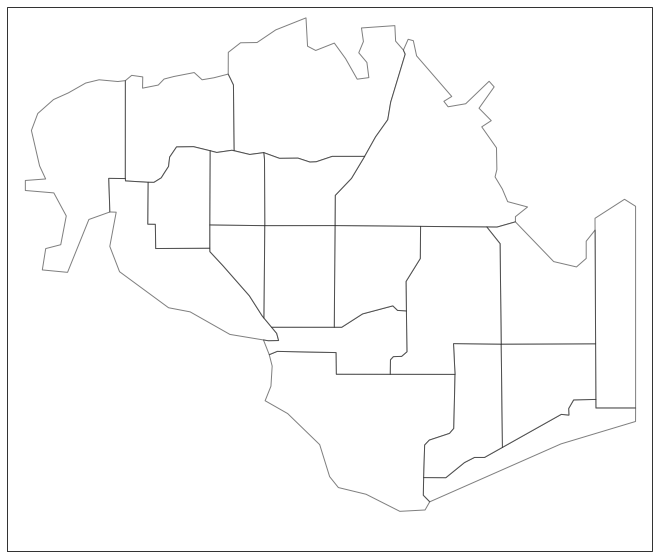

In [25]:
shpfile = "../data/Sensor Data and Maps/StHimarkNeighborhoodShapefiles/StHimark.shp"
reader = shpreader.Reader(shpfile)

shapes = list(reader.geometries())

print(shapes)
west = -13357330
east = -13325450
north = 25858
south = -1000
#-13323168,-1145

fig = plt.figure(figsize=(15,10))

ax = fig.add_subplot(1,1,1, projection=ccrs.Mercator())
ax.add_geometries(shapes, ccrs.Mercator(), edgecolor='black', facecolor='white', alpha=0.5,zorder=1)
ax.set_extent([west, east, south, north], ccrs.Mercator())